In [14]:
import numpy as np
import cv2
import os, os.path

# Construcción de la base de datos
imageDir='200/'
image_set=[]

valid_extensions = [".jpg", ".jpeg"]
file_list = os.listdir(imageDir)

for file in file_list:
    extension = os.path.splitext(file)[1]
    if extension.lower() not in valid_extensions:
        continue
    image_set.append(os.path.join(imageDir, file))

dict = {}

for imageName in image_set:
    image = cv2.imread(imageName) # 0 para escala de grises
    hist = cv2.calcHist([image],[0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256]) 
    # [0, 1, 2] Canales para los colores
    #  None - no usar ninguna máscara o parte de la imagen 
    # [8] calcular las porciones por tono de gris
    # [0, 256] valor minimo y maximo de la escala de gris
    desc = hist.flatten()  # Aplana y asegura que el arreglo es unidimensional
    desc = desc / (image.shape[0] * image.shape[1]) # Normaliza el histograma con el tamaño de la imagen
    dict[imageName] = desc

In [3]:
dict

{'200/200048298_ac3fb9487b.jpg': array([1.19277108e-03, 5.42168675e-05, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        2.71084337e-04, 2.34939759e-04, 1.80722892e-05, 6.02409639e-05,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 6.02409639e-06,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.000000

In [11]:
import random
from matplotlib import pyplot as plt
%matplotlib inline

[1728  205 1104]


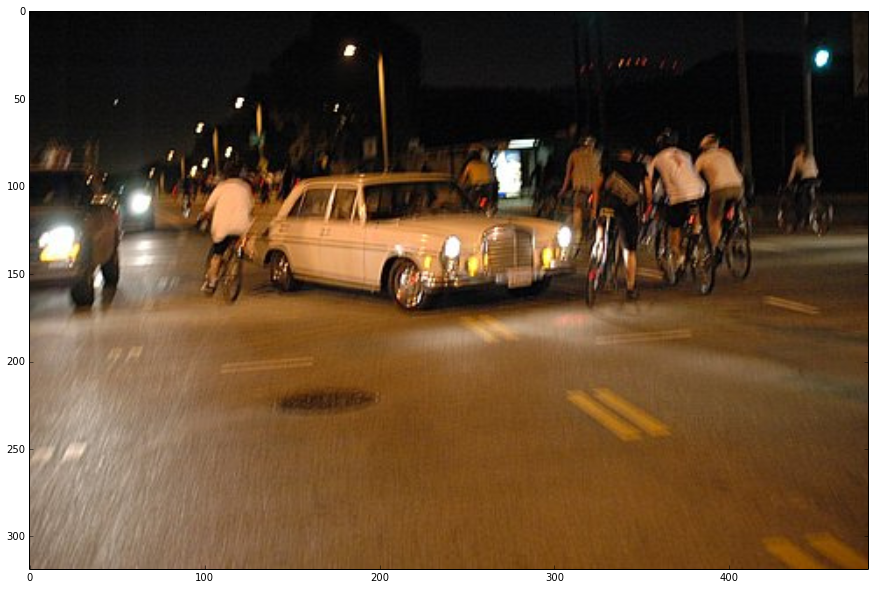

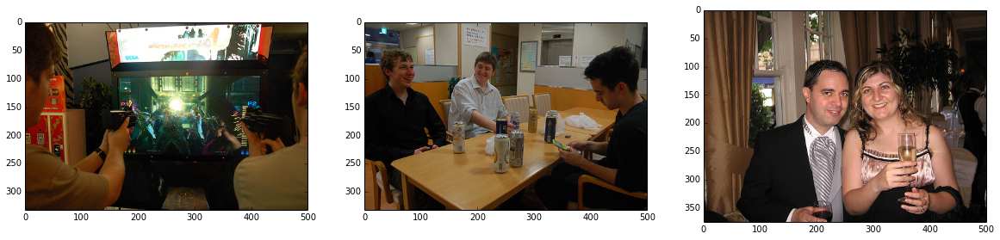

In [22]:
# Consultar una imagen
# Escoger una imagen aleatoria
queryName = random.choice(file_list)
queryImage= cv2.imread(os.path.join(imageDir, queryName))
queryHist = cv2.calcHist([queryImage],[0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
descQuery = queryHist.flatten()
descQuery = descQuery/(queryImage.shape[0]*queryImage.shape[1])

# Calcular distancia a los histogramas almacenados
distances=[]
for imageName in image_set:
    dist = np.linalg.norm(descQuery - dict[imageName])
    distances.append(dist)
    
index = np.argsort(distances) # Ordena la lista de distancias, devuelve los indices de los elementos en el orden correcto
print(index[1:4])
# Visualizacion

# fig1 = plt.imshow(queryImage[:,:,::-1]) # RGB -> BGR
fig1 = plt.figure(figsize=(20, 10))
fig1 = plt.imshow(queryImage[:,:,::-1])
plt.show()

fig2 = plt.figure(figsize=(20, 10))

for i in range(1,4):
    fig2.add_subplot(1, 3, i)
    imag = cv2.imread(image_set[index[i]])
    plt.imshow(imag[:,:,::-1])
    
plt.show();

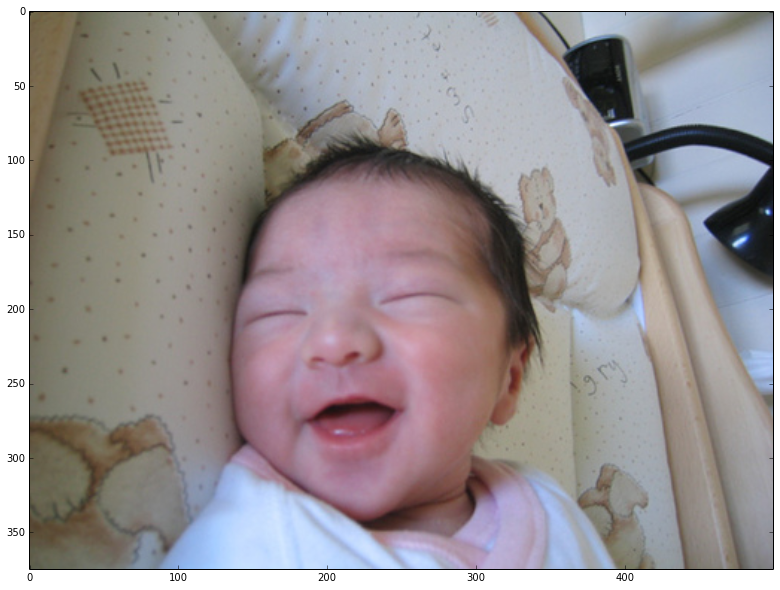

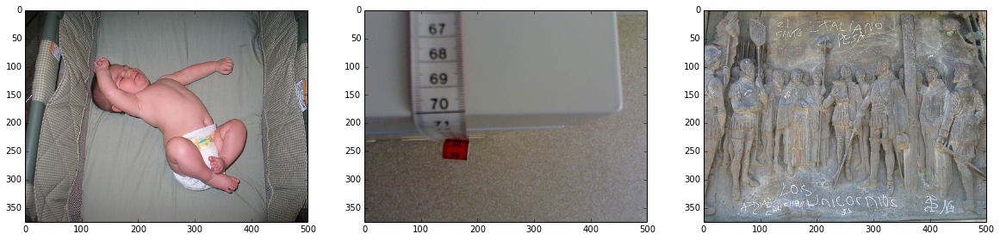